In [2]:
import petls
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tadasets
import time
import scipy
import timeit
from gudhi import AlphaComplex

In [3]:
n = 500

torus = tadasets.torus(n=n, c=3, a=1, noise=0.0, seed=0)
def get_complex(n):
    replicate = 0
    # n=500 is a good number for the actual test, but not for debugging
    
    complex = petls.Alpha(torus, max_dim=3)
    return complex

def get_filtrations(delta):
    start = 0.0
    end = 4.0 #5.0
    filtrations = [start+i*delta for i in range(int((end-start)/delta) + 1)]
    return filtrations


    

In [4]:

lims = (-4,4)


In [5]:

ac = AlphaComplex(points=torus)
stree = ac.create_simplex_tree(output_squared_values=True)

ph_start = time.time()
pers = stree.persistence(min_persistence=0.1)
ph_time = time.time() - ph_start
print(f"Persistence homology computation time: {ph_time:.2f} seconds")
print(pers)
print(f"Number of simplices: {stree.num_simplices()}")

import numpy as np
import plotly.graph_objects as go
import plotly

# from plotly.graph_objs import graph_objs as go
import ipywidgets as widgets

plotly.offline.init_notebook_mode()
from plotly.offline import iplot

alpha = widgets.FloatSlider(
    value = 0.005,
    min = 0.0,
    max = 2.0,
    step = 0.01,
    description = 'Alpha:', 
    readout_format = '.4f'
)

def plot_alpha_1_skeleton(alpha_thresh):
    show_triangles = True  # Set to True to show triangles
    show_tetrahedra = False  # Set to True to show tetrahedra
# def plot_alpha_1_skeleton(torus, stree, alpha_thresh, show_triangles=False):
    # Extract edges and vertices under the filtration threshold
    edges = []
    vertices = set()
    triangles = []
    pyramids = []

    for simplex, filtration_value in stree.get_filtration():
        if filtration_value <= alpha_thresh:
            if len(simplex) == 1:  # vertex
                vertices.add(simplex[0])
            elif len(simplex) == 2:  # edge
                i, j = simplex
                edges.append((i, j))
                vertices.add(i)
                vertices.add(j)
            elif len(simplex) == 3 and show_triangles:
                i, j, k = simplex
                triangles.append((i, j, k))
                vertices.update([i, j, k])
            elif len(simplex) == 4 and show_tetrahedra:
                i, j, k, l = simplex
                pyramids.append((i, j, k, l))
                vertices.update([i, j, k, l])
    # Get coordinates for the vertices
    vertex_coords = torus[list(vertices)]
    idx_map = {v: i for i, v in enumerate(sorted(vertices))}  # map old -> new indices
    
    # Create scatter plot for vertices
    vertex_trace = go.Scatter3d(
        x=vertex_coords[:, 0],
        y=vertex_coords[:, 1],
        z=vertex_coords[:, 2],
        mode='markers',
        marker=dict(size=3, color='blue'),
        # name='Vertices'
    )
    
    # Create line segments for edges
    edge_x = []
    edge_y = []
    edge_z = []
    for i, j in edges:
        edge_x += [torus[i, 0], torus[j, 0], None]
        edge_y += [torus[i, 1], torus[j, 1], None]
        edge_z += [torus[i, 2], torus[j, 2], None]
    
    edge_trace = go.Scatter3d(
        x=edge_x,
        y=edge_y,
        z=edge_z,
        mode='lines',
        line=dict(width=3, color='black'),
        # name='Edges'
    )
    
    # Triangle mesh
    mesh_trace = None
    if show_triangles and triangles:
        # Re-index vertices for Mesh3d
        i_list, j_list, k_list = zip(*[(idx_map[i], idx_map[j], idx_map[k]) for i, j, k in triangles])
        mesh_trace = go.Mesh3d(
            x=vertex_coords[:, 0],
            y=vertex_coords[:, 1],
            z=vertex_coords[:, 2],
            i=i_list,
            j=j_list,
            k=k_list,
            color='violet',
            opacity=1.0,
            # name='Triangles',
            showscale=False
        )

    # Tetrahedra mesh
    tetra_trace = None
    if pyramids:
        # Re-index vertices for Mesh3d
        tuples = []
        for i, j, k, l in pyramids:
            tuples.append((idx_map[i], idx_map[j], idx_map[k])) # leave out l
            tuples.append((idx_map[i], idx_map[j], idx_map[l])) # leave out k
            tuples.append((idx_map[i], idx_map[k], idx_map[l])) # leave out j
            tuples.append((idx_map[j], idx_map[k], idx_map[l])) # leave out i

        i_list, j_list, k_list = zip(*tuples)
        
        tetra_trace = go.Mesh3d(
            x=vertex_coords[:, 0],
            y=vertex_coords[:, 1],
            z=vertex_coords[:, 2],
            i=i_list,
            j=j_list,
            k=k_list,
            color='purple',
            opacity=1.0,
            name='Tetrahedra',
            showscale=False
        )

    traces = [edge_trace, vertex_trace]
    if mesh_trace:
        traces.insert(0, mesh_trace)
    if tetra_trace:
        traces.append(tetra_trace)


    fig = go.FigureWidget(
        data = traces, 
        layout = go.Layout(
            # title = dict(
            #     text = 'Alpha Complex Representation of the 2-Torus'
            # ), 
            scene = dict(
                xaxis = dict(nticks = 8, range = list(lims), visible=False), 
                yaxis = dict(nticks = 8, range = list(lims), visible=False), 
                zaxis = dict(nticks = 8, range = [-1,1], visible=False),
                # xaxis = dict(visible=False), 
                # yaxis = dict(visible=False), 
                # zaxis = dict(visible=False),
                aspectmode = 'data'
            ),
            showlegend=False,
            margin = dict(l=0.00, r=0.00, b=0, t=0,pad=0),
            plot_bgcolor='rgba(0,0,0,0)',
            title=None,
            
        )   
    )

    # plotly.io.write_image(fig, 'alpha_complex.png', scale=1, width=1080, height=1080)
    iplot(fig)
    return fig
    
    # if filename:
    #     plotly.io.write_image(fig, filename)

# plot_alpha_1_skeleton(alpha_thresh=0.4)
# dummy = widgets.interact(plot_alpha_1_skeleton, alpha_thresh=alpha);
# plot_alpha_1_skeleton(torus, stree, alpha_thresh=0.8,show_triangles=True)
# plot_alpha_1_skeleton(alpha_thresh=0.4)

Persistence homology computation time: 0.01 seconds
[(2, (0.6027976174042147, 1.0512996334911726)), (1, (0.09035107249615781, 4.006148821317317)), (1, (0.06864910753115111, 1.0000032128474876)), (1, (0.12029947176376438, 0.5965586429190792)), (1, (0.09619586701304628, 0.5435838337107406)), (1, (0.10052995078060509, 0.5151098233764005)), (1, (0.1447445995271423, 0.4625271671276985)), (1, (0.12845633279020774, 0.43045476692451307)), (1, (0.1119682684245859, 0.3961403569236292)), (1, (0.06452703066106502, 0.34411217985555587)), (1, (0.13099254482421918, 0.40324662451668314)), (1, (0.12353994730598564, 0.3850358625083267)), (1, (0.22971759643587525, 0.489849810906056)), (1, (0.10000831774178948, 0.36004156222588257)), (1, (0.11712447158920544, 0.36378892316860223)), (1, (0.09021716148983991, 0.33474067326612095)), (1, (0.08425097849523042, 0.306082438512107)), (1, (0.16882307260007423, 0.38617041504241173)), (1, (0.15865606635519566, 0.3656238700862159)), (1, (0.14026959493684865, 0.340966

ModuleNotFoundError: No module named 'ipywidgets'

In [ ]:
# for a in [0.0, 0.2, 0.48, 2.0]:
#     fig = plot_alpha_1_skeleton(alpha_thresh=a)
#     fig.write_image(f"pictures/alpha_torus_{a:.2f}.png", format='png', width=1080, height=1080)

In [6]:

complex_start = time.time()
complex = petls.Alpha(torus, max_dim=3)
complex_time = time.time() - complex_start
print(f"Complex construction time: {complex_time:.2f} seconds")


Complex construction time: 1.52 seconds


In [7]:
delta = 0.1
filtrations = get_filtrations(delta)
dims = [0, 1, 2]


In [8]:
request_list = []
for filtration in filtrations:
    for dim in dims:
        request_list.append([dim, filtration, filtration + delta])    


In [10]:
from scipy.linalg import eigvalsh
from scipy.sparse.linalg import eigsh

import seaborn as sns
import matplotlib.pyplot as plt



In [ ]:

time_all_filtrations_start = time.time()
Ls = []
# filtrations = filtrations[-4:]
dims = [0,1,2]
filtrations = get_filtrations(delta=1)
# filtrations = filtrations[-4:]
complex.set_eigs_Algorithm(lambda L: scipy.linalg.eigvalsh(L))



# compute all the eigenvalues
all_eigs = []
for idx, filtration in enumerate(filtrations):
    for idx2, filtration2 in enumerate(filtrations):
        if (idx2 < idx) or (idx == 0 and idx2 == 0):
            continue
        for dim in dims:      
            s = complex.spectra(dim, a=filtration, b=filtration2)
            all_eigs.append(s)



In [ ]:
print(all_eigs)

In [ ]:
figsize = (1.12, .8)
# figsize = (4, 3)
rc ={'figure.figsize': figsize,
    'font.size':12,
    'axes.edgecolor':'black'
}

sns.set_theme(style="white", palette= 'deep',font_scale=1.0,rc=rc)
filtrations = get_filtrations(delta=1)
n_filt = len(filtrations)
for dim in dims:
    # set up figure
    fig, axes  = plt.subplots(n_filt, n_filt, 
                              gridspec_kw={'hspace': 0.0, 'wspace': 0.0},
                              figsize=figsize)
    for ax in axes.flatten():
        ax.grid('on',linestyle='--')
        ax.set_xticks([])
        ax.set_yticks([])

    # add the filtration labels
    # this has to be done before the histograms are plotted
    # (unclear why)
    # for i in range(n_filt):
    #     axes[n_filt-1,i].set_xlabel(filtrations[i])
    #     axes[n_filt-i-1,0].set_ylabel(filtrations[i],rotation=0)
    #     axes[n_filt-i-1,0].yaxis.set_label_coords(-0.3, 0.3)  # Adjust y-label position for better visibility
    # get the max eigenvalue for scaling the histograms x-axis
    max_eigval = max([max(s[3]) for s in all_eigs if len(s[3]) > 0 and s[0] == dim])
    print("Max eigenvalue:", max_eigval, flush=True)

    # plot all the histograms
    for idx, filtration in enumerate(filtrations):
        for idx2, filtration2 in enumerate(filtrations):
            if (idx2 < idx) or (idx == 0 and idx2 == 0):
                continue
            # filter to get the correct eigenvalue set
            right_eigs = [s for s in all_eigs if s[0] == dim and s[1] == filtration and s[2] == filtration2]
            assert len(right_eigs) == 1, f"Expected exactly one eigenvalue set for dim={dim}, a={filtration}, b={filtration2}, but found {len(right_eigs)}"
            s = right_eigs[0]

            if len(s[3]) > 0:
                # print(max(s[3]))
                nonzeros = [x for x in s[3] if x > 0]
                sns.histplot(data=nonzeros,bins=20,ax=axes[n_filt-idx2-1,idx],binrange=(0.0,max_eigval),color='royalblue')
            
                
            # plt.title(f"Spectra for dim={dim}, filtration={filtration}")

    max_y = max([ax.get_ylim()[1] for ax in axes.flatten()])
    for ax in axes.flatten():
        
        ax.set_ylim(0.0, max_y)
    print(f"Max y limit: {max_y:.2f}",flush=True)

    # add the diagonal
    for i in range(n_filt):
        ax = axes[n_filt-i-1,i]
        ax.plot([0,1],[0,1], transform=ax.transAxes, color='dimgray', linestyle='-', linewidth=1)

    if dim == 2:
        suptitle_dim = "N"
    else:
        suptitle_dim = dim
    fig.suptitle(r"$\Delta_{" + f"{suptitle_dim}" + r"}^{a,b}$",y=1.23)
    fig.supxlabel(r"$a$",y=-0.15)
    fig.supylabel(r"$b$",x=-0.03,rotation=0)  # Adjust y-label position for better visibility
    # plt.margins(x=0,y=0)
    plt.savefig(f"large_alpha_spectra_dim_{dim}_small.png", dpi=1200,bbox_inches='tight',pad_inches=0.03,transparent=True)
    plt.show()
    print("done")
# time_spectra = time.time() - time_start
# print(f"d{dim}, a{filtration}, LShape={L.shape},Ltime={L_time:.2f}, spectra time: {time_spectra:.2f} seconds",flush=True)
time_all_filtrations = time.time() - time_all_filtrations_start
print(f"Total time for all filtrations: {time_all_filtrations:.2f} seconds")

In [ ]:
def min_nonzero(eigs):
    tol = 1e-4
    nonzeros = [x for x in eigs if x > tol]
    if len(nonzeros) == 0:
        return 0.0
    return min(nonzeros)


In [15]:
figsize = (4, 3)
rc ={'figure.figsize': figsize,
    'font.size':12,
    'axes.edgecolor':'black'
}

sns.set_theme(style="white", palette= 'deep',font_scale=1.0,rc=rc)


In [ ]:

filtrations = get_filtrations(delta=1)
n_filt = len(filtrations)  
for dim in [1]:
    # set up figure
    fig, axes  = plt.subplots(n_filt, n_filt, 
                              gridspec_kw={'hspace': 0.0, 'wspace': 0.0},
                              figsize=figsize)
    for ax in axes.flatten():
        ax.grid('on',linestyle='--')
        ax.set_xticks([])
        ax.set_yticks([])

    # add the filtration labels
    # this has to be done before the histograms are plotted
    # (unclear why)
    for i in range(n_filt):
        axes[n_filt-1,i].set_xlabel(filtrations[i])
        axes[n_filt-i-1,0].set_ylabel(filtrations[i],rotation=0)
        axes[n_filt-i-1,0].yaxis.set_label_coords(-0.3, 0.3)  # Adjust y-label position for better visibility
    # get the max eigenvalue for scaling the histograms x-axis
    max_eigval = max([max(s[3]) for s in all_eigs if len(s[3]) > 0 and s[0] == dim])
    print("Max eigenvalue:", max_eigval, flush=True)

    # plot all the histograms
    for idx, filtration in enumerate(filtrations):
        for idx2, filtration2 in enumerate(filtrations):
            if (idx2 < idx) or (idx == 0 and idx2 == 0):
                continue
            # filter to get the correct eigenvalue set
            right_eigs = [s for s in all_eigs if s[0] == dim and s[1] == filtration and s[2] == filtration2]
            assert len(right_eigs) == 1, f"Expected exactly one eigenvalue set for dim={dim}, a={filtration}, b={filtration2}, but found {len(right_eigs)}"
            s = right_eigs[0]

            if len(s[3]) > 0:
                # print(max(s[3]))
                nonzeros = [x for x in s[3] if x > 0]
                sns.histplot(data=nonzeros,bins=20,ax=axes[n_filt-idx2-1,idx],binrange=(0.0,max_eigval),color='royalblue')
            
                
            # plt.title(f"Spectra for dim={dim}, filtration={filtration}")

    max_y = max([ax.get_ylim()[1] for ax in axes.flatten()])
    for ax in axes.flatten():
        
        ax.set_ylim(0.0, max_y)
    print(f"Max y limit: {max_y:.2f}",flush=True)

    # add the diagonal
    for i in range(n_filt):
        ax = axes[n_filt-i-1,i]
        ax.plot([0,1],[0,1], transform=ax.transAxes, color='dimgray', linestyle='-', linewidth=1)

    if dim == 2:
        suptitle_dim = "N"
    else:
        suptitle_dim = dim
    fig.suptitle(r"$\Delta_{" + f"{suptitle_dim}" + r"}^{a,b}$ Eigenvalue Distributions",y=1.0)
    fig.supxlabel(r"Filtration $a$",y=-0.05)
    fig.supylabel(r"Filtration $b$",x=-0.01,rotation=90)  # Adjust y-label position for better visibility
    # plt.margins(x=0,y=0)
    plt.savefig(f"large_alpha_spectra_dim_{dim}.png", dpi=1200,bbox_inches='tight',pad_inches=0.03,transparent=False)
    plt.show()
    print("done")
# time_spectra = time.time() - time_start
# print(f"d{dim}, a{filtration}, LShape={L.shape},Ltime={L_time:.2f}, spectra time: {time_spectra:.2f} seconds",flush=True)
# time_all_filtrations = time.time() - time_all_filtrations_start
# print(f"Total time for all filtrations: {time_all_filtrations:.2f} seconds")

In [ ]:

summaries, filtrations, dims = petls.summaries(all_eigs,min_nonzero,lower_triangle=np.nan)

print(filtrations)
for dim in [1]:
    fig, ax = plt.subplots(figsize=figsize)
    ax.grid(False)
    # fig, ax = plt.subplots(2,2,figsize=(10, 8))
    data = summaries[dim]
    petls.plot_summary(ax, data,cmap="Purples")
    ax.set_xticks(filtrations,labels=filtrations)
    ax.set_yticks(filtrations,labels=filtrations)
    ax.set_title(r"$\Delta_{" + f"{dim}" + r"}^{a,b}$ Minimum Nonzero Eigenvalues" ,y=1.0)
    ax.set_xlabel(r"Filtration $a$")
    ax.set_ylabel(r"Filtration $b$")
    plt.savefig(f"min_nonzero_alpha_d{dim}.png", dpi=1200, bbox_inches="tight")
    plt.show()

In [ ]:
def betti(eigs):
    tol = 1e-4
    return len([x for x in eigs if x < tol])

def max_wrapper(eigs):
    return max(eigs) if len(eigs) > 0 else 0.0

In [11]:
def store_eigs(all_eigs, filename):
    with open(filename, 'w') as f:
        for s in all_eigs:
            f.write(f"{s[0]},{s[1]},{s[2]},{','.join(map(str, s[3]))}\n")

def read_eigs(filename):
    all_eigs = []
    with open(filename, 'r') as f:
        for line in f:
            parts = line.strip().split(',')
            # print(parts)
            dim = int(parts[0])
            a = float(parts[1])
            b = float(parts[2])
            if len(parts) == 4 and parts[3] == '':
                eigs = []
            else:
                eigs = list(map(float, parts[3:]))
            all_eigs.append((dim, a, b, eigs))
    # print(all_eigs)
    return all_eigs



In [12]:
all_eigs2 = read_eigs('all_eigs.txt') # read output from large_alpha.py (job submitted by large_alpha.sh)

In [13]:
print(all_eigs2)
# all_eigs = all_eigs2

[(0, 0.0, 0.25, [2.3469329e-07, 0.03704965, 0.044039495, 0.12445186, 0.16201653, 0.2416229, 0.24745774, 0.2676066, 0.31826055, 0.3193919, 0.36067066, 0.36742038, 0.3846547, 0.42048058, 0.44063568, 0.4586206, 0.50860745, 0.5334268, 0.5554309, 0.5986782, 0.6323542, 0.6542157, 0.6711919, 0.7516025, 0.7844456, 0.8031448, 0.82781076, 0.9058645, 0.9433454, 0.95786643, 1.0129505, 1.0625805, 1.1067874, 1.1596043, 1.1804302, 1.1933115, 1.2289876, 1.2553668, 1.3242544, 1.3331031, 1.3361381, 1.3541609, 1.394623, 1.4381377, 1.4686978, 1.5110346, 1.5206585, 1.5535964, 1.5837206, 1.6176006, 1.6482264, 1.6728199, 1.706672, 1.7559209, 1.7827817, 1.8438723, 1.8663616, 1.9112931, 1.9343901, 1.973543, 2.008086, 2.0433764, 2.0605426, 2.06776, 2.106784, 2.1903794, 2.2160852, 2.2503352, 2.2988787, 2.3365586, 2.3709347, 2.3880308, 2.409868, 2.4280784, 2.4673617, 2.4743123, 2.5172472, 2.5299685, 2.578359, 2.6140845, 2.6512914, 2.6838975, 2.7498977, 2.767216, 2.7835016, 2.8184977, 2.8333993, 2.859241, 2.934647

Max eigenvalue: 28.773151
Max y limit: 97.65


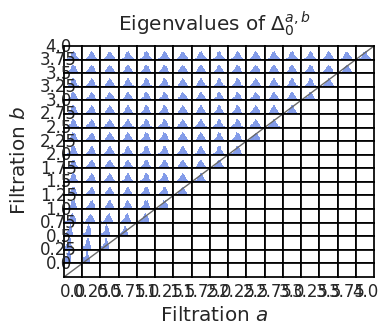

Max eigenvalue: 28.773146
Max y limit: 512.40


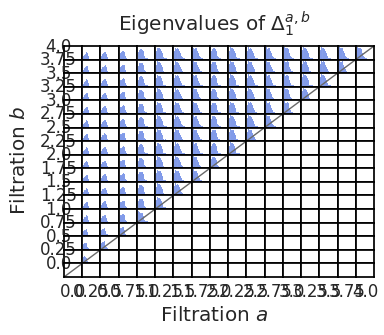

Max eigenvalue: 16.24529
Max y limit: 645.75


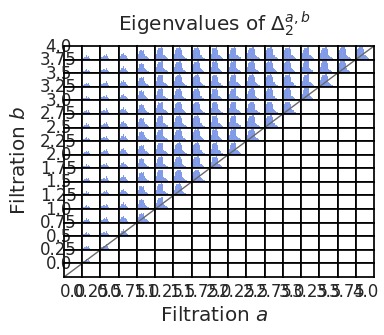

done


In [16]:
# sns.set_theme(style="white", palette= 'deep',font_scale=1.0,rc=rc)
filtrations = get_filtrations(delta=0.25)
n_filt = len(filtrations)
for dim in [0,1,2]:
    # set up figure
    fig, axes  = plt.subplots(n_filt, n_filt, 
                              gridspec_kw={'hspace': 0.0, 'wspace': 0.0},
                              figsize=figsize)
    for ax in axes.flatten():
        ax.grid('on',linestyle='--')
        ax.set_xticks([])
        ax.set_yticks([])

    # add the filtration labels
    # this has to be done before the histograms are plotted
    # (unclear why)
    for i in range(n_filt):
        axes[n_filt-1,i].set_xlabel(filtrations[i])
        axes[n_filt-i-1,0].set_ylabel(filtrations[i],rotation=0)
        axes[n_filt-i-1,0].yaxis.set_label_coords(-0.3, 0.3)  # Adjust y-label position for better visibility
    # get the max eigenvalue for scaling the histograms x-axis
    max_eigval = max([max(s[3]) for s in all_eigs2 if len(s[3]) > 0 and s[0] == dim])
    print("Max eigenvalue:", max_eigval, flush=True)

    # plot all the histograms
    for idx, filtration in enumerate(filtrations):
        for idx2, filtration2 in enumerate(filtrations):
            if (idx2 < idx) or (idx == 0 and idx2 == 0):
                continue
            # filter to get the correct eigenvalue set
            right_eigs = [s for s in all_eigs2 if s[0] == dim and s[1] == filtration and s[2] == filtration2]
            assert len(right_eigs) == 1, f"Expected exactly one eigenvalue set for dim={dim}, a={filtration}, b={filtration2}, but found {len(right_eigs)}"
            s = right_eigs[0]

            if len(s[3]) > 0:
                # print(max(s[3]))
                nonzeros = [x for x in s[3] if x > 0]
                sns.histplot(data=nonzeros,bins=20,ax=axes[n_filt-idx2-1,idx],binrange=(0.0,max_eigval),color='royalblue')
            
                
            # plt.title(f"Spectra for dim={dim}, filtration={filtration}")

    max_y = max([ax.get_ylim()[1] for ax in axes.flatten()])
    for ax in axes.flatten():
        
        ax.set_ylim(0.0, max_y)
    print(f"Max y limit: {max_y:.2f}",flush=True)

    # add the diagonal
    for i in range(n_filt):
        ax = axes[n_filt-i-1,i]
        ax.plot([0,1],[0,1], transform=ax.transAxes, color='dimgray', linestyle='-', linewidth=1)

    fig.suptitle(r"Eigenvalues of $\Delta_{" + f"{dim}" + r"}^{a,b}$",y=1.0)
    fig.supxlabel(r"Filtration $a$",y=-0.05)
    fig.supylabel(r"Filtration $b$",x=-0.01)

    # plt.savefig(f"large_alpha_fine_spectra_dim_{dim}.png", dpi=300,bbox_inches='tight')
    plt.show()
print("done")

Max eigenvalue: 28.773146


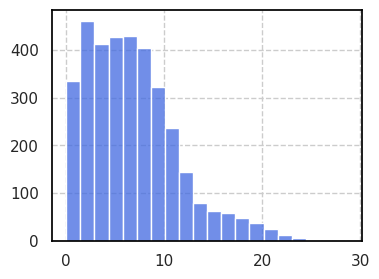

done


In [36]:
# sns.set_theme(style="white", palette= 'deep',font_scale=1.0,rc=rc)
filtrations = get_filtrations(delta=0.25)
n_filt = len(filtrations)
for dim in [1]:
    # set up figure
    fig, axes  = plt.subplots(1, 1, 
                              gridspec_kw={'hspace': 0.0, 'wspace': 0.0},
                              figsize=figsize)
    axes.grid('on',linestyle='--')
    # axes.set_xticks([])
    # axes.set_yticks([])

    # add the filtration labels
    # this has to be done before the histograms are plotted
    # (unclear why)
    filtration = 2.0
    filtration2 = 3.5
    # for i in range(n_filt):
        # axes.set_xlabel(fi/ltrations[i])
        # axes.set_ylabel(filtrations[i],rotation=0)
        # axes.yaxis.set_label_coords(-0.3, 0.3)  # Adjust y-label position for better visibility
    # get the max eigenvalue for scaling the histograms x-axis
    max_eigval = max([max(s[3]) for s in all_eigs2 if len(s[3]) > 0 and s[0] == dim])
    print("Max eigenvalue:", max_eigval, flush=True)

    # plot all the histograms
    
    # for idx, filtration in enumerate(filtrations):
    #     for idx2, filtration2 in enumerate(filtrations):
    #         if (idx2 < idx) or (idx == 0 and idx2 == 0):
    #             continue
    #         # filter to get the correct eigenvalue set
    right_eigs = [s for s in all_eigs2 if s[0] == dim and s[1] == filtration and s[2] == filtration2]
    assert len(right_eigs) == 1, f"Expected exactly one eigenvalue set for dim={dim}, a={filtration}, b={filtration2}, but found {len(right_eigs)}"
    s = right_eigs[0]

    if len(s[3]) > 0:
        # print(max(s[3]))
        nonzeros = [x for x in s[3] if x > 0]
        sns.histplot(data=nonzeros,bins=20,ax=axes,binrange=(0.0,max_eigval),color='royalblue')
    
    axes.set_ylabel("")
        
    # plt.title(f"Spectra for dim={dim}, filtration={filtration}")

    # max_y = max([axes.get_ylim()[1] for ax in axes.flatten()])
    # for ax in axes.flatten():
        
    # axes.set_ylim(0.0, max_y)
    # print(f"Max y limit: {max_y:.2f}",flush=True)

    # add the diagonal
    # for i in range(n_filt):
    #     ax = axes[n_filt-i-1,i]
    #     ax.plot([0,1],[0,1], transform=ax.transAxes, color='dimgray', linestyle='-', linewidth=1)

    # fig.suptitle(r"Eigenvalues of $\Delta_{" + f"{dim}" + r"}^{" + f"{filtration}, {filtration2}" + r"}$",y=1.0)
    # fig.supxlabel(r"Eigenvalue",y=-0.05)
    # fig.supylabel(r"Count",x=-0.01)

    plt.savefig(f"large_alpha_spectra_{filtration}_{filtration2}.png", dpi=600,bbox_inches='tight')
    plt.show()
print("done")

In [ ]:
def summaries_graphs(all_eigs, summary_func, label):
    summaries, filtrations, dims = petls.summaries(all_eigs,summary_func,lower_triangle=np.nan)
    for dim in [0,1,2]:
        fig, ax = plt.subplots(figsize=figsize)

        ax.grid(False)
        # fig, ax = plt.subplots(2,2,figsize=(10, 8))
        ax.set_xticks([])
        ax.set_yticks([])
        data = summaries[dim]
        np.fill_diagonal(data, 0)
        petls.plot_summary(ax, data,cmap="Purples")
        # ax.set_xticks(filtrations,labels=filtrations)
        # ax.set_yticks(filtrations,labels=filtrations)
        # ax.set_title(r"$\Delta_{" + f"{dim}" + r"}^{a,b}$ Minimum Nonzero Eigenvalues" ,y=1.0)
        # ax.set_xlabel(r"Filtration $a$")
        # ax.set_ylabel(r"Filtration $b$")
        plt.savefig(f"eigs_summaries_{label}_d{dim}.png", dpi=600, bbox_inches="tight")
        plt.show()

summaries_graphs(all_eigs2, min_nonzero,"min")
summaries_graphs(all_eigs2, max_wrapper,"max")
summaries_graphs(all_eigs2, betti,"betti")


In [17]:
subset = [s for s in all_eigs if s[0] == 1 and s[1] >= 1.05 and s[2] <= 4.05]
for s in subset:
    print(f"d{s[0]}, a{s[1]}, b{s[2]}, min_eigs={min(s[3])}")
# print(subset)


NameError: name 'all_eigs' is not defined

In [ ]:

def betti_disp(eigs):
    tol = 1e-4
    zeros = [x for x in eigs if x < tol]
    print(zeros)
    return len(zeros)
# d2_eigs = [s for s in all_eigs if s[0] == 2]
summaries, filtrations, dims = petls.summaries(all_eigs,betti_disp,lower_triangle=np.nan)
data = summaries[1]
np.fill_diagonal(data, 0)
print(summaries[1])    

In [ ]:
import scipy.linalg


L = complex.get_L(1, a=0.25, b=0.25)
eigs = scipy.linalg.eigvalsh(L)
print(eigs)

In [ ]:
from math import sqrt
a = 4
b = 2
c = 5

sides = [a,b,c]
s = sum(sides)/2
print(s)
area = sqrt(s*(s-a)*(s-b)*(s-c))
circumradius = (a*b*c)/(4*area)
alphas = [a/2, b/2, circumradius]
alpha_squares = [x*x for x in alphas]
print(f"sides={sides}")
print(f"alphas={alphas}")
print(f"alpha_squares={alpha_squares}")